# Regression : Logistic Regression

In [3]:
import pandas as pd
import numpy as np
data  = pd.read_csv("./data/US-pumpkins.csv")

## Recap

Dependent and Independent Variables


- Imagine that we want to make a graph of the amount of rainfall that occurs at different times of year. 

- Rainfall depends on time of year, but time of year does not depend on rainfall. 

- Therefore, rainfall is the dependent variable and time of year is the independent variable. 

- The single dependent variable is also called the **outcome variable or target** variable. 

- The independent variable(s) are also called **feature variable(s)**. 

- The independent variable belongs on the x-axis (horizontal line) of the graph and the dependent variable belongs on the y-axis (vertical line). 

- This is because the independent variable is the one that is being manipulated or controlled, while the dependent variable is the one that is being observed and measured in response to changes in the independent variable. 




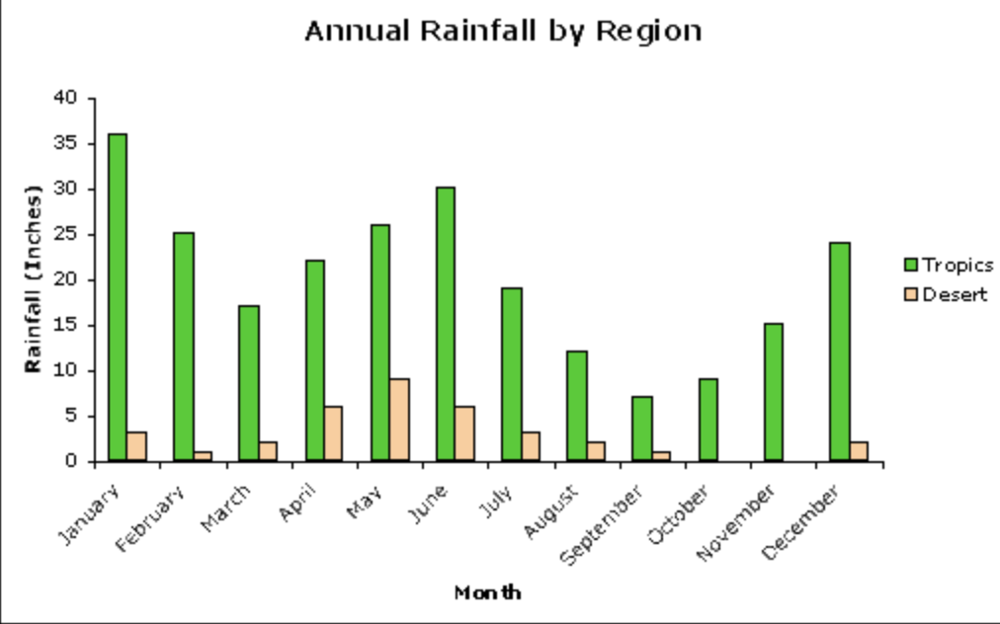

# Review of Machine Learning Project Steps

- Define the problem
  
- Data Acquisition

- Data Cleaning:

- Model Training

- Model Testing

- Model Deployment: 

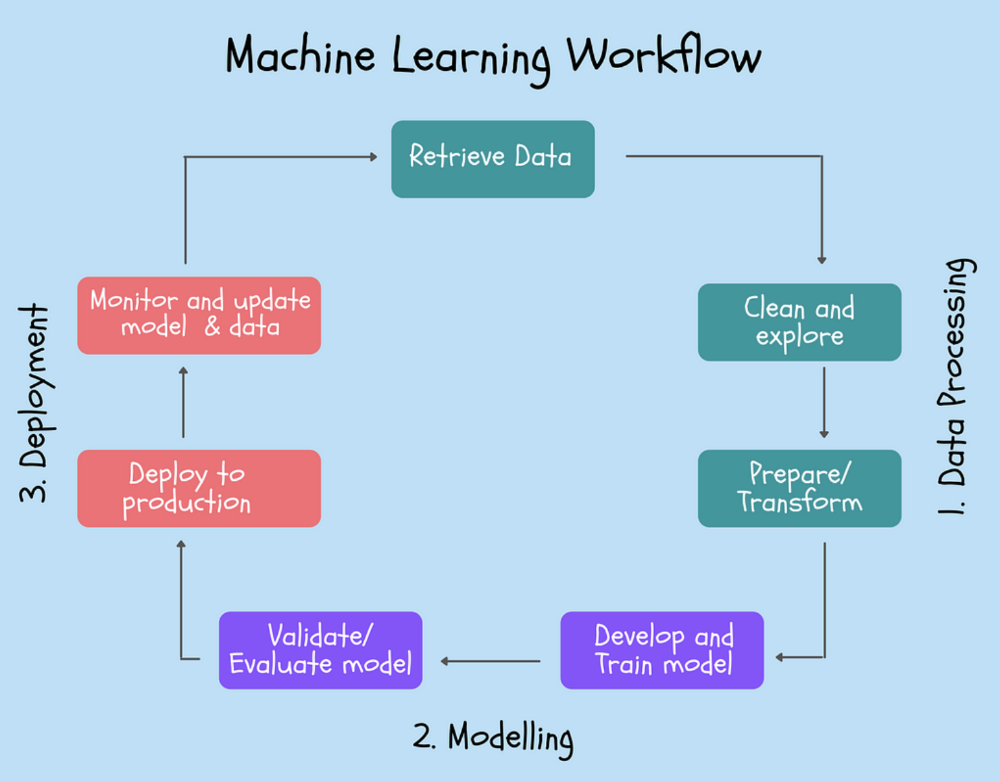

## Data Acquisition - Representation of the data



- Web scrapping lessons we had in Python Session

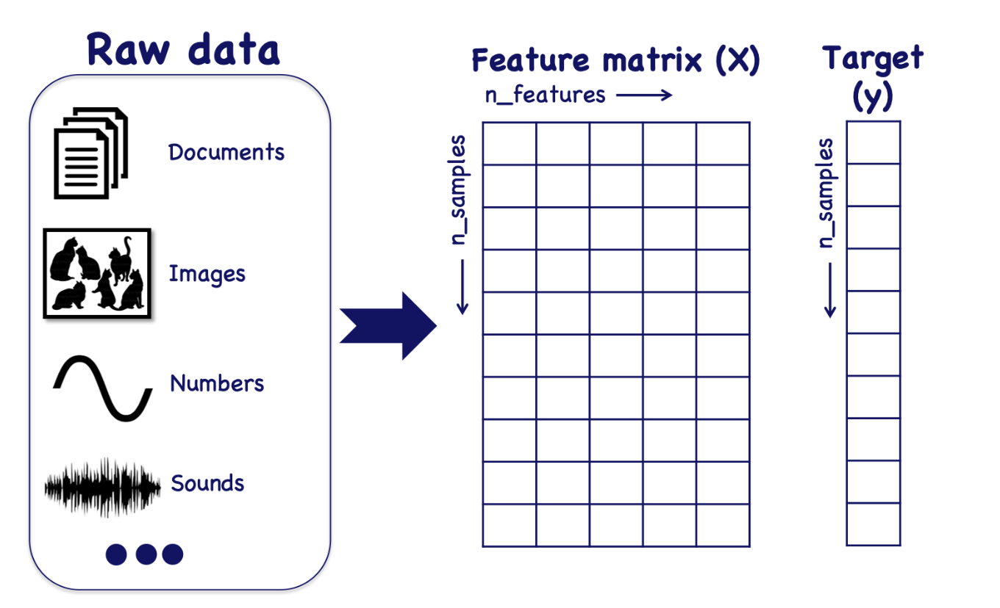

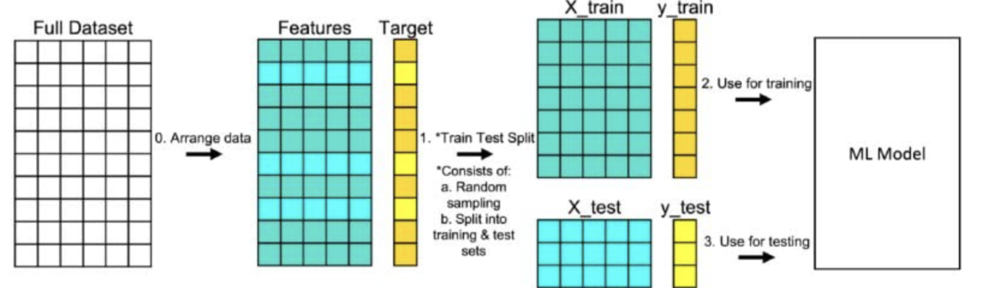

In [7]:
housing = pd.DataFrame(pd.read_csv("./data/Housing.csv"))
housing

,price,area,bedrooms,bathrooms,stories,mainroad,guestroom,basement,hotwaterheating,airconditioning,parking,prefarea,furnishingstatus
0,13300000,7420,4,2,3,yes,no,no,no,yes,2,yes,furnished
1,12250000,8960,4,4,4,yes,no,no,no,yes,3,no,furnished
2,12250000,9960,3,2,2,yes,no,yes,no,no,2,yes,semi-furnished
3,12215000,7500,4,2,2,yes,no,yes,no,yes,3,yes,furnished
4,11410000,7420,4,1,2,yes,yes,yes,no,yes,2,no,furnished
...,...,...,...,...,...,...,...,...,...,...,...,...,...
540,1820000,3000,2,1,1,yes,no,yes,no,no,2,no,unfurnished
541,1767150,2400,3,1,1,no,no,no,no,no,0,no,semi-furnished
542,1750000,3620,2,1,1,yes,no,no,no,no,0,no,unfurnished
543,1750000,2910,3,1,1,no,no,no,no,no,0,no,furnished


In [2]:
import pandas as pd

data = {'Tweet': ['I love this product!', 'This is the worst thing I have ever bought.', 'Amazing quality and great customer service.', 'Terrible experience, would not recommend.'],
        'Sentiment': ['Positive', 'Negative', 'Positive', 'Negative']}

df = pd.DataFrame(data)

print(df)

                                         Tweet Sentiment
0                         I love this product!  Positive
1  This is the worst thing I have ever bought.  Negative
2  Amazing quality and great customer service.  Positive
3    Terrible experience, would not recommend.  Negative


## Data Preparation

Refrence from Machine Learning Mastery [Tour of Data Preparation Techniques for Machine Learning](https://machinelearningmastery.com/data-preparation-techniques-for-machine-learning/)

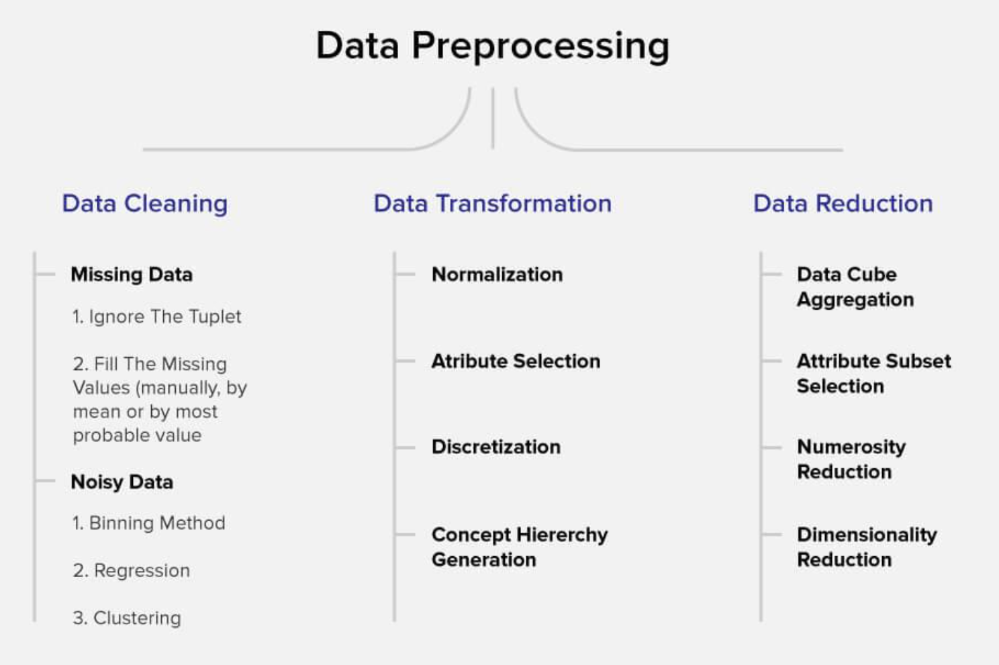

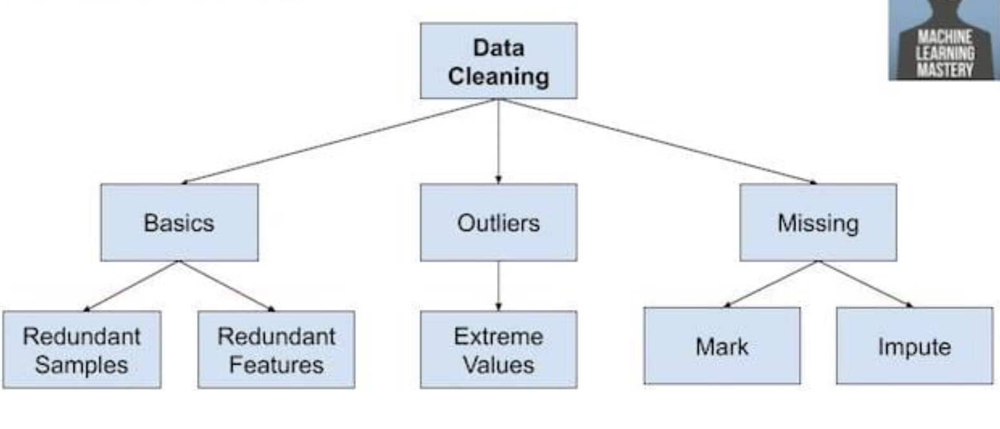

# Modelling

- **Model Training:** A machine learning algorithm is used on the training dataset to train the model.

- **Model Testing:** After the model is trained, we need to test and validate it for further processing. 

> Modelling is iterative, you can try many algorithms and tune parameters before obtaining the best algorithm

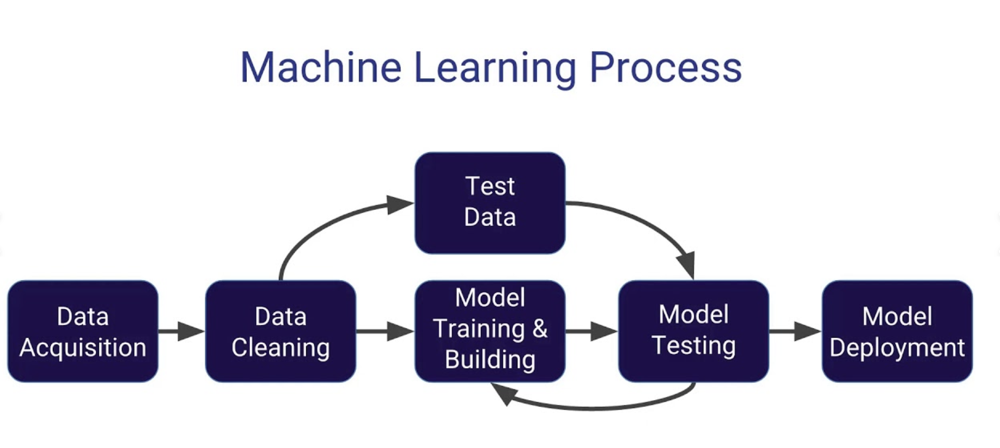

### How to measure accuracy of a regression or Regression Matrics

> What is metric? In machine learning, a metric is a function that measures the quality of the model’s predictions. Metrics are used to evaluate and compare the performance of different models on a specific task.

- The performance of a regression model can be measured using several metrics. 

- The **sklearn.metrics** module implements several functions to measure regression performance.  
  
  1. Mean Absolute Error (MAE), 

  2. Mean Squared Error (MSE), 

  3. Root Mean Squared Error (RMSE), 

  4. R-squared,  

  5. Adjusted R-squared². 


All available in Sklearn: https://scikit-learn.org/stable/modules/model_evaluation.html

Sklearn has consisten API for all ML task: https://scikit-learn.org/stable/index.html


- There isn’t a single “best” metric for regression, as it depends on the specific problem and the desired outcome.

- MSE is sensitive to outliers, while MAE is more robust.

> Residuals are the building blocks of the majority of the metrics. In simple terms, a residual is a difference between the actual value and the predicted value. 

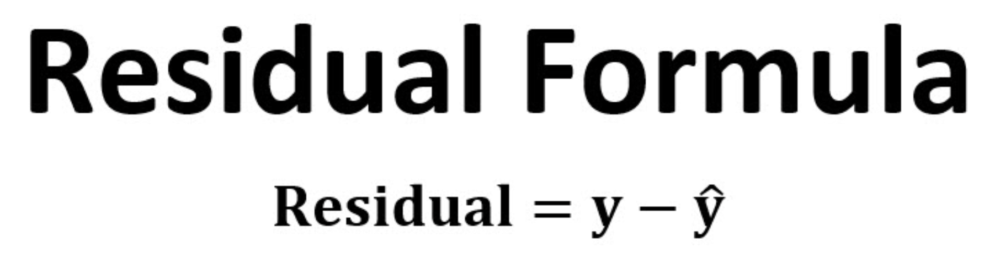

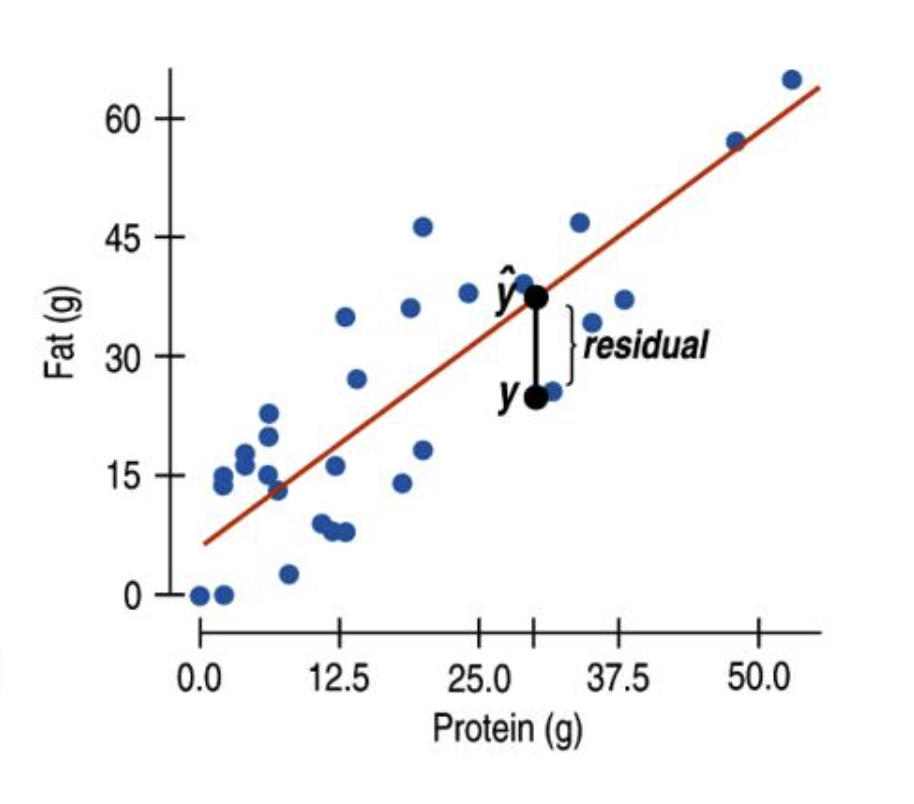

Refrences: 

- [Regression Metrics for Machine Learning](https://machinelearningmastery.com/regression-metrics-for-machine-learning/)

- [Regression metrics](https://medium.com/tag/regression-metric)

> continue with first example of diabetes dataset before Logistic

### Recap: Linear Regression: Diabetes Dataset

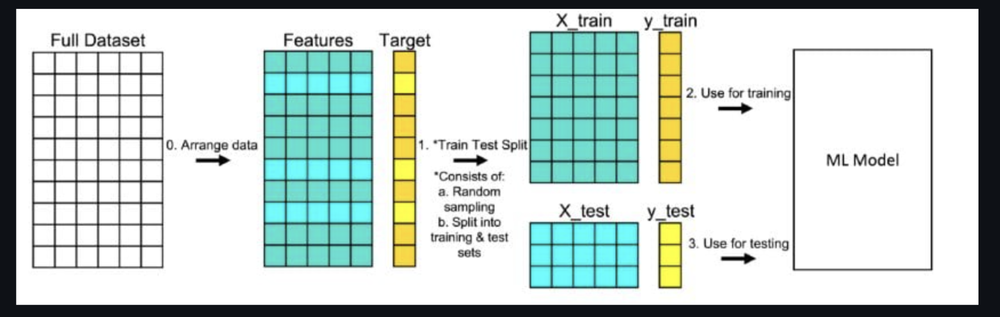

Data aquisition/loading

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model, model_selection
from sklearn.metrics import mean_squared_error, r2_score

Sklearn datasets: https://scikit-learn.org/stable/datasets.html

In [10]:
X, y = datasets.load_diabetes(return_X_y=True, as_frame=True)
X

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641
...,...,...,...,...,...,...,...,...,...,...
437,0.041708,0.050680,0.019662,0.059744,-0.005697,-0.002566,-0.028674,-0.002592,0.031193,0.007207
438,-0.005515,0.050680,-0.015906,-0.067642,0.049341,0.079165,-0.028674,0.034309,-0.018114,0.044485
439,0.041708,0.050680,-0.015906,0.017293,-0.037344,-0.013840,-0.024993,-0.011080,-0.046883,0.015491
440,-0.045472,-0.044642,0.039062,0.001215,0.016318,0.015283,-0.028674,0.026560,0.044529,-0.025930


In [11]:
y

0      151.0
1       75.0
2      141.0
3      206.0
4      135.0
       ...  
437    178.0
438    104.0
439    132.0
440    220.0
441     57.0
Name: target, Length: 442, dtype: float64

> We use an array to feed in into our ML

Prepare your dataset

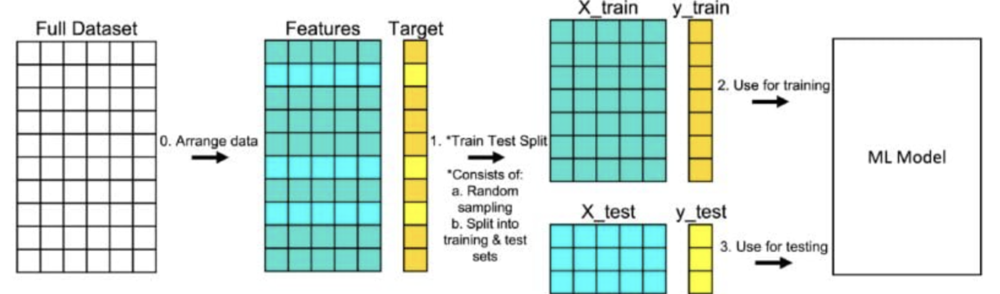

In [31]:
# Load the diabetes dataset
X, y = datasets.load_diabetes(return_X_y=True)

# Use only one feature
X = X[:, np.newaxis,2]


In [30]:
X[:5]

array([ 0.06169621, -0.05147406,  0.04445121, -0.01159501, -0.03638469])

>  X = X[:, np.newaxis, 2] adds an additional dimension to the array X, while X = X[:, 2] simply selects the third column of the array. The additional dimension is often used in machine learning algorithms to represent the number of features for each sample in the dataset.

> This is because many machine learning algorithms expect the input data to have a specific shape, where the number of features is represented by an additional dimension.



In [11]:
X[:5]

array([[ 0.06169621],
       [-0.05147406],
       [ 0.04445121],
       [-0.01159501],
       [-0.03638469]])

In [12]:
y[:5]

array([151.,  75., 141., 206., 135.])

In [32]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.33)

In [33]:
X_train[:5]

array([[ 0.06816308],
       [-0.03638469],
       [ 0.01966154],
       [ 0.00672779],
       [-0.00728377]])

In [15]:
# X_train

# pd.DataFrame(X_train).head()
# # see sample data from the array
# # X_train[0:2]

,0
0,-0.007284
1,0.060618
2,-0.010517
3,-0.005128
4,-0.062252


> Alternatively

In [16]:
# # # Split the data into training/testing sets
# X_train = X[:-20]
# X_test =  X[-20:]

# # # Split the targets into training/testing sets
# y_train = y[:-20]
# y_test =  y[-20:]

In [19]:


# see sample data from the array
X_train[0:5]

array([[ 0.06169621],
       [-0.05147406],
       [ 0.04445121],
       [-0.01159501],
       [-0.03638469]])

In [110]:
X_train[:5]

array([[ 0.06169621],
       [-0.05147406],
       [ 0.04445121],
       [-0.01159501],
       [-0.03638469]])

Train the model

linear_model in Sklearn (under Supervised): https://scikit-learn.org/stable/supervised_learning.html

In [35]:
regr = linear_model.LinearRegression() # you can name the objective anything you like


In [36]:
regr

LinearRegression()

In [37]:
# Create linear regression object
regr = linear_model.LinearRegression() # you can name the objective anything you like

# Train the model using the training sets
regr.fit(X_train, y_train) # train with x_train and y_train

# Make predictions using the testing set
y_pred = regr.predict(X_test) # make prediction on X_test

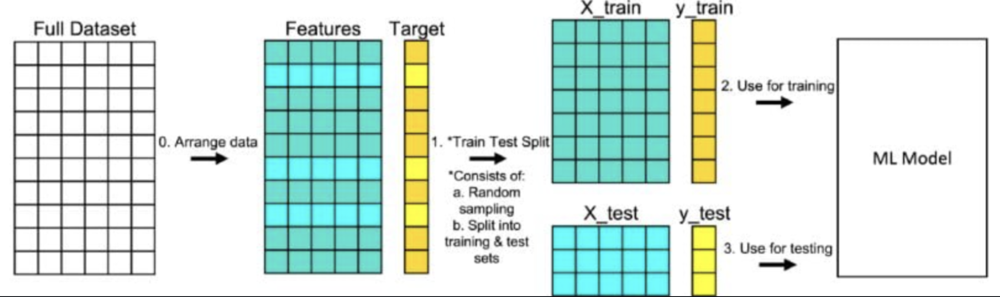

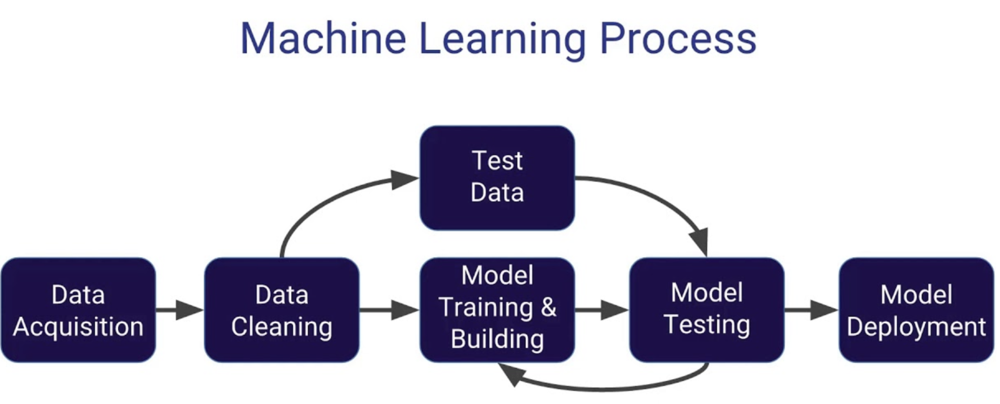

Check the model performance/evaluate the model

mean_squared_error: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_squared_error.html

In [38]:
mean_squared_error(y_test, y_pred) # use y_test (gold label) and y_pred (predicted value)

4138.513707953422

> An MSE of 2548.07239872597 indicates that, on average, the model’s predictions are about sqrt(2548.07239872597) = 50.479 units away from the actual values.

In [22]:
r2_score(y_test, y_pred)

0.47257544798227147

In [24]:
# The coefficients
print("Coefficients: \n", regr.coef_)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred))

Coefficients: 
 [938.23786125]
Mean squared error: 2548.07
Coefficient of determination: 0.47


Plot your prediction

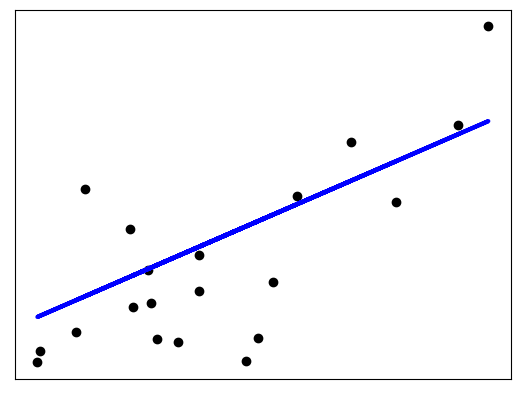

In [38]:
# Plot outputs
plt.scatter(X_test, y_test, color="black")
plt.plot(X_test, y_pred, color="blue", linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

### Practice

- Housing prediction Linear Regression: https://www.kaggle.com/code/ashydv/housing-price-prediction-linear-regression

# Logistic Regression

- Logistic Regression (LR) is a classification algorithm that predicts the outcome (class) of a dependent variable (y) based on the independent variable (x)

- Binary classification 



There are other types of logistic regression that can be used for different types of classification tasks. For example:

    - Multinomial Logistic Regression: This is an extension of binary logistic regression that can be used for multi-class classification tasks, where there are more than two possible outcomes.

    - Ordinal Logistic Regression: This is a type of logistic regression that can be used for ordinal classification tasks, where the possible outcomes have a natural order.

    - Multilevel Logistic Regression: This is a type of logistic regression that can be used for hierarchical or clustered data, where observations are nested within groups.

## Example : Define the question

In [39]:
pumpkins = pd.read_csv("./data/US-pumpkins.csv")

In [40]:
pumpkins.head()

,City Name,Type,Package,Variety,Sub Variety,Grade,Date,Low Price,High Price,Mostly Low,...,Unit of Sale,Quality,Condition,Appearance,Storage,Crop,Repack,Trans Mode,Unnamed: 24,Unnamed: 25
0,BALTIMORE,NaN,24 inch bins,NaN,NaN,NaN,4/29/17,270.0,280.0,270.0,...,NaN,NaN,NaN,NaN,NaN,NaN,E,NaN,NaN,NaN
1,BALTIMORE,NaN,24 inch bins,NaN,NaN,NaN,5/6/17,270.0,280.0,270.0,...,NaN,NaN,NaN,NaN,NaN,NaN,E,NaN,NaN,NaN
2,BALTIMORE,NaN,24 inch bins,HOWDEN TYPE,NaN,NaN,9/24/16,160.0,160.0,160.0,...,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN
3,BALTIMORE,NaN,24 inch bins,HOWDEN TYPE,NaN,NaN,9/24/16,160.0,160.0,160.0,...,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN
4,BALTIMORE,NaN,24 inch bins,HOWDEN TYPE,NaN,NaN,11/5/16,90.0,100.0,90.0,...,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN


> we will express this as a binary: 'Orange' or 'Not Orange'. There is also a 'striped' category in our dataset but there are few instances of it, so we will not use it. It disappears once we remove null values from the dataset, anyway.


- Linear regression worked better with more correlated variables? 

- Logistic regression is the opposite - the variables don't have to align. That works for this data which has somewhat weak correlations.



> Logistic regression will give more accurate results if you use more data; our small dataset is not optimal for this task, so keep that in mind.



In [43]:
# Import LabelEncoder from sklearn.preprocessing

# Create a list of the columns to encode: columns
new_columns = ['Color','Origin','Item Size','Variety','City Name','Package']

# Create the new dataframe: new_pumpkins
new_pumpkins = pumpkins.drop([c for c in pumpkins.columns if c not in new_columns], axis=1)

# Drop the rows with missing values
new_pumpkins.dropna(inplace=True)

I love this cat

000s0s00s0s000102003030044 > emebedding

Inaso wannnan magen


In [44]:

new_pumpkins

,City Name,Package,Variety,Origin,Item Size,Color
2,BALTIMORE,24 inch bins,HOWDEN TYPE,DELAWARE,med,ORANGE
3,BALTIMORE,24 inch bins,HOWDEN TYPE,VIRGINIA,med,ORANGE
4,BALTIMORE,24 inch bins,HOWDEN TYPE,MARYLAND,lge,ORANGE
5,BALTIMORE,24 inch bins,HOWDEN TYPE,MARYLAND,lge,ORANGE
6,BALTIMORE,36 inch bins,HOWDEN TYPE,MARYLAND,med,ORANGE
...,...,...,...,...,...,...
1694,ST. LOUIS,24 inch bins,HOWDEN WHITE TYPE,ILLINOIS,xlge,WHITE
1695,ST. LOUIS,24 inch bins,HOWDEN WHITE TYPE,ILLINOIS,xlge,WHITE
1696,ST. LOUIS,24 inch bins,HOWDEN WHITE TYPE,ILLINOIS,xlge,WHITE
1697,ST. LOUIS,24 inch bins,HOWDEN WHITE TYPE,ILLINOIS,xlge,WHITE


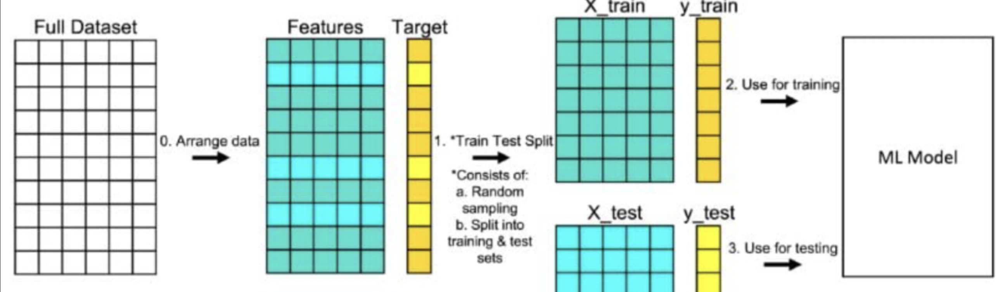

In [47]:

from sklearn.preprocessing import LabelEncoder

# Create the encoder instance: le

new_pumpkins = new_pumpkins.apply(LabelEncoder().fit_transform)

In [48]:
new_pumpkins

,City Name,Package,Variety,Origin,Item Size,Color
2,1,3,4,3,3,0
3,1,3,4,17,3,0
4,1,3,4,5,2,0
5,1,3,4,5,2,0
6,1,4,4,5,3,0
...,...,...,...,...,...,...
1694,12,3,5,4,6,1
1695,12,3,5,4,6,1
1696,12,3,5,4,6,1
1697,12,3,5,4,6,1


In [45]:
new_pumpkins.info

<bound method DataFrame.info of       City Name       Package            Variety    Origin Item Size   Color
2     BALTIMORE  24 inch bins        HOWDEN TYPE  DELAWARE       med  ORANGE
3     BALTIMORE  24 inch bins        HOWDEN TYPE  VIRGINIA       med  ORANGE
4     BALTIMORE  24 inch bins        HOWDEN TYPE  MARYLAND       lge  ORANGE
5     BALTIMORE  24 inch bins        HOWDEN TYPE  MARYLAND       lge  ORANGE
6     BALTIMORE  36 inch bins        HOWDEN TYPE  MARYLAND       med  ORANGE
...         ...           ...                ...       ...       ...     ...
1694  ST. LOUIS  24 inch bins  HOWDEN WHITE TYPE  ILLINOIS      xlge   WHITE
1695  ST. LOUIS  24 inch bins  HOWDEN WHITE TYPE  ILLINOIS      xlge   WHITE
1696  ST. LOUIS  24 inch bins  HOWDEN WHITE TYPE  ILLINOIS      xlge   WHITE
1697  ST. LOUIS  24 inch bins  HOWDEN WHITE TYPE  ILLINOIS      xlge   WHITE
1698  ST. LOUIS  24 inch bins  HOWDEN WHITE TYPE  ILLINOIS      xlge   WHITE

[991 rows x 6 columns]>

# Build your model



In [49]:
new_pumpkins

,City Name,Package,Variety,Origin,Item Size,Color
2,1,3,4,3,3,0
3,1,3,4,17,3,0
4,1,3,4,5,2,0
5,1,3,4,5,2,0
6,1,4,4,5,3,0
...,...,...,...,...,...,...
1694,12,3,5,4,6,1
1695,12,3,5,4,6,1
1696,12,3,5,4,6,1
1697,12,3,5,4,6,1


In [53]:

from sklearn.model_selection import train_test_split

#Select the variables you want to use in your classification model and split the training and test sets calling train_test_split():
Selected_features = ['Origin','Item Size','Variety','City Name','Package']

X = new_pumpkins[Selected_features]
y = new_pumpkins['Color']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


Train

In [54]:
#Now you can train your model, by calling fit() with your training data, and print out its result:

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report 
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

In [55]:
predictions

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0])

Evaluate model performance

model performance


- Accuracy (0-1)

- recall

- precission

- F1-Score

- Roc-Curve

In [56]:
# print the evaluation
print('Accuracy: ', accuracy_score(y_test, predictions))

Accuracy:  0.8140703517587939


In [17]:
accuracy_score

<function sklearn.metrics._classification.accuracy_score(y_true, y_pred, *, normalize=True, sample_weight=None)>

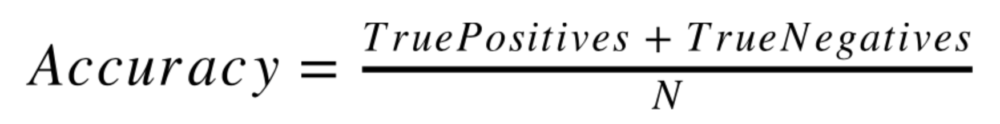

In [57]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.83      0.98      0.90       166
           1       0.00      0.00      0.00        33

    accuracy                           0.81       199
   macro avg       0.42      0.49      0.45       199
weighted avg       0.69      0.81      0.75       199



In [12]:
print('Predicted labels: ', predictions)

Predicted labels:  [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0]


## Confusion Matrix

- Classification accuracy alone can be misleading if you have an unequal number of observations in each class or if you have more than two classes in your dataset. 

- Calculating a confusion matrix can give you a better idea of what your classification model is getting right and what types of errors it is making.



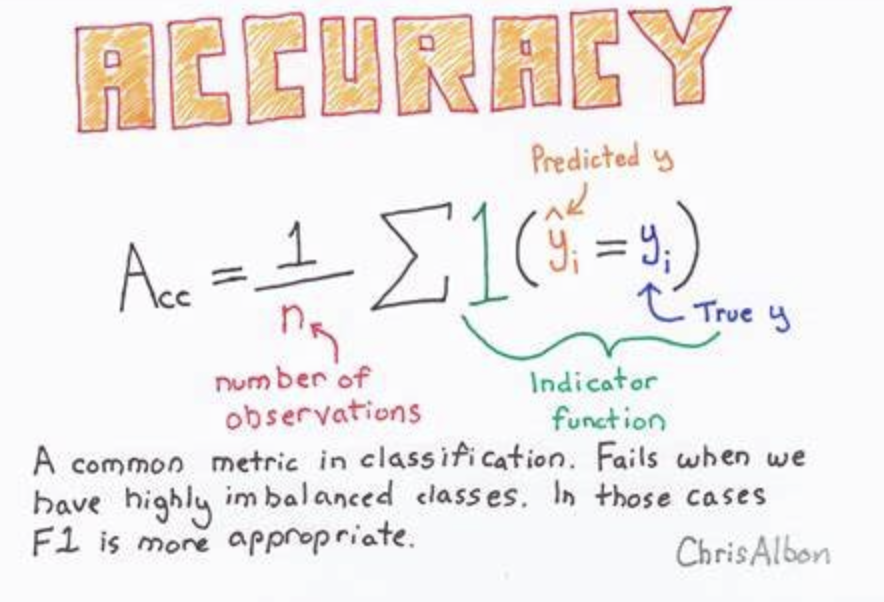

In [58]:
#Classification accuracy can be misleading if you have an unequal number of observations in each class or if you have more than two classes in your dataset. 

# For example, if your test data has 95 "no-cancer" labels and five "cancer" labels, by guessing "no-cancer" for every customer it can misleadingly give a 95 percent accuracy¹.

#Here's an example in Python that demonstrates this issue:

#Asumme, 0 = "no-cancer", 1 = "cancer"

from sklearn.metrics import accuracy_score
y_true = [0] * 95 + [1] * 5
y_pred = [0] * 100
print(f'Accuracy: {accuracy_score(y_true, y_pred)}')

Accuracy: 0.95


Confusion matrix

Refrenece: [Confusion Matrix](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay.from_predictions)

In [62]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, predictions)

array([[162,   4],
       [ 33,   0]])

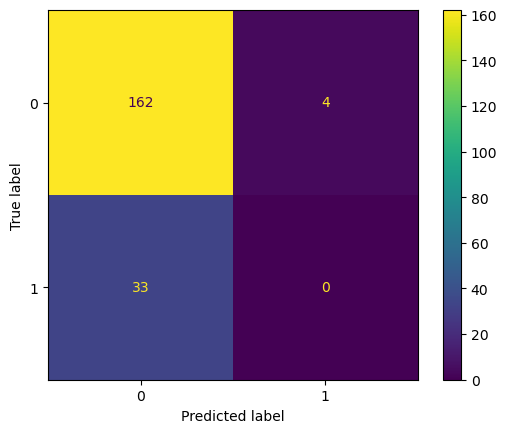

In [61]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(y_test, predictions)

Other ways

> In Scikit-learn, confusion matrices Rows (axis 0) are actual labels and columns (axis 1) are predicted labels.



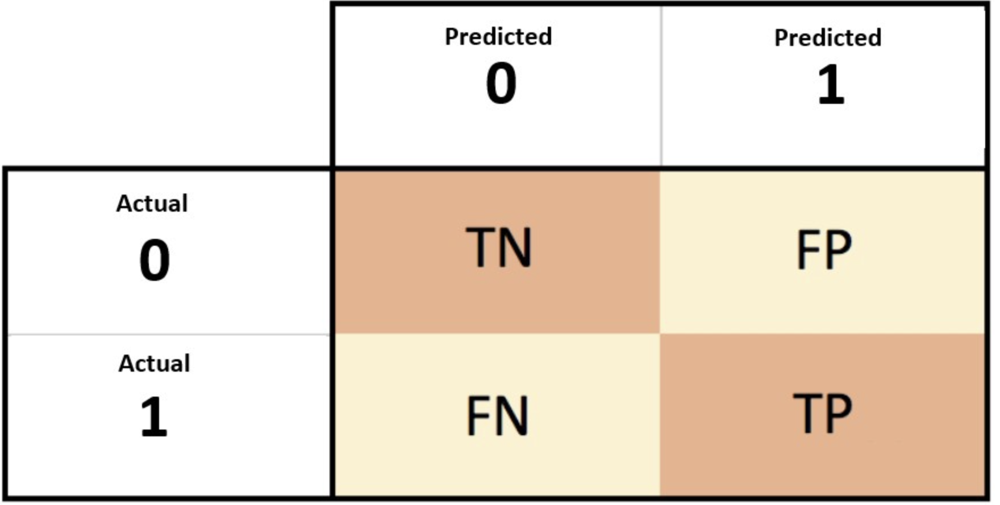

What's going on here? Let's say our model is asked to classify pumpkins between two binary categories, category 'orange' and category 'not-orange'.



- If your model predicts a pumpkin as not orange and it belongs to category 'not-orange' in reality we call it a true negative, shown by the top left number.

- If your model predicts a pumpkin as orange and it belongs to category 'not-orange' in reality we call it a false negative, shown by the bottom left number.

- If your model predicts a pumpkin as not orange and it belongs to category 'orange' in reality we call it a false positive, shown by the top right number.

- If your model predicts a pumpkin as orange and it belongs to category 'orange' in reality we call it a true positive, shown by the bottom right number.

>  It is preferable to have a larger number of true positives and true negatives and a lower number of false positives and false negatives, which implies that the model performs better.



- How does the confusion matrix relate to precision and recall? Remember, the classification report printed above showed precision (0.83) and recall (0.98).

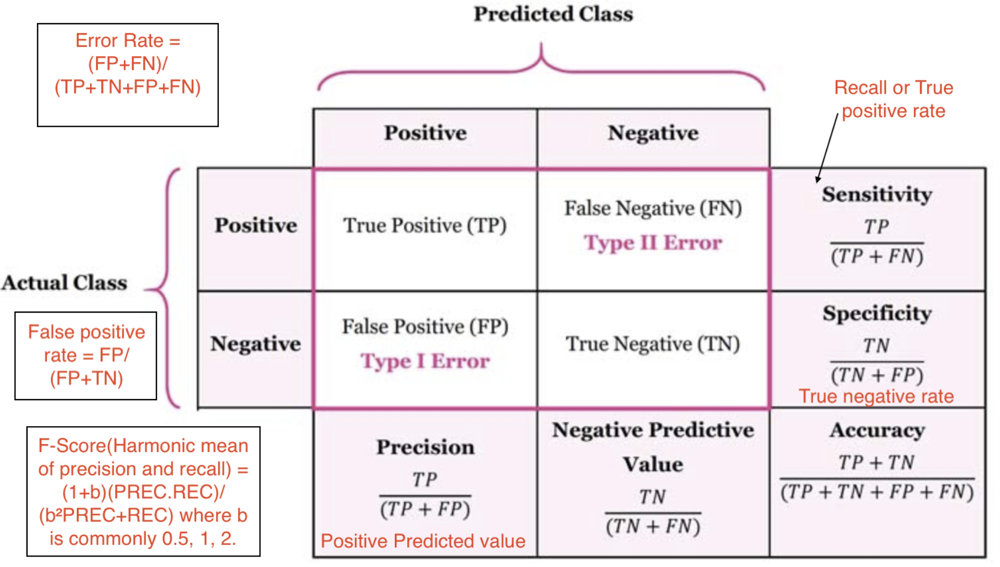

### Precision

- Precision measures how many of the items identified as positive by the model are actually positive. 

-  In other words, precision answers the question: “Of all the items that were identified as positive, how many were actually positive?”

- It is calculated as the number of true positives divided by the sum of true positives and false positives  

### Accuracy

- Accuracy measures how many of the items were correctly identified by the model

-  In other words, accuracy answers the question: “Of all the items, how many were correctly identified?”

-  It is calculated as the number of true positives plus true negatives divided by the total number of items

### Recall

- Recall measures how many of the positive items were correctly identified by the model. 

- In other words, recall answers the question: “Of all the positive items, how many were correctly identified?”

- It is calculated as the number of true positives divided by the sum of true positives and false negatives 

### F1-Score

> The F1-score is a measure of a model’s accuracy that takes into account both precision and recall. It is the harmonic mean of precision and recall and is used to evaluate binary classification systems. 



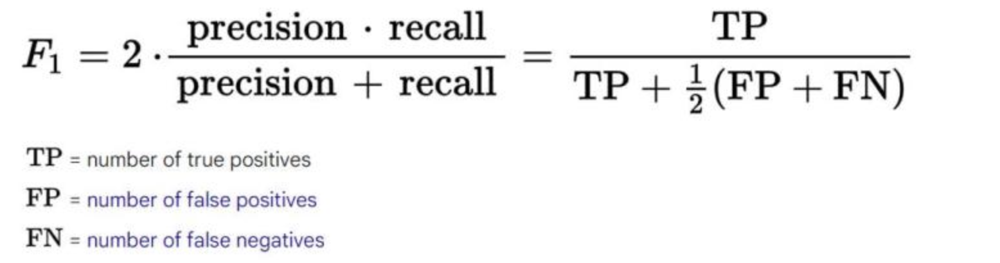

> The F1-score is useful when you want to balance precision and recall, and it can be particularly helpful when dealing with imbalanced datasets where one class is much more common than the other 1.

- The F1-score is useful when you want to balance precision and recall, and it can be particularly helpful when dealing with imbalanced datasets where one class is much more common than the other .

### Weighted F1 and Macro F1

- In a multi-class classification problem, the F1-score can be calculated for each class individually and then averaged to obtain a single score that represents the performance of the model across all classes. There are several ways to average the F1-scores for each class, including macro and weighted averaging.

- Macro-averaging (Macro-F1) calculates the F1-score for each class independently and then takes the average of these scores. This method treats all classes as equally important, regardless of how many instances of each class are present in the dataset.

- Weighted averaging (Weighted-F1) also calculates the F1-score for each class independently but takes a weighted average of these scores, where the weight for each class is determined by the number of instances of that class in the dataset. This method takes into account class imbalance and gives more importance to classes with more instances.


---

### Example

> Suppose you have a basket containing 100 pieces of fruit: 80 apples and 20 oranges. You have a machine that can identify whether a piece of fruit is an apple or an orange. You run all 100 pieces of fruit through the machine and it identifies 70 apples and 30 oranges.

In this example:

- The number of true positives (apples correctly identified as apples) is 70.

- The number of false positives (oranges incorrectly identified as apples) is 10.

- The number of false negatives (apples incorrectly identified as oranges) is 10.

- The number of true negatives (oranges correctly identified as oranges) is 10.



In [ ]:
The precision would be calculated as: 70 / (70 + 10) = 0.875 or 87.5%.

The accuracy would be calculated as: (70 + 10) / 100 = 0.8 or 80%.

The recall would be calculated as: 70 / (70 + 10) = 0.875 or 87.5%.

The F1-score would be calculated as: 2 * ((0.875 * 0.875) / (0.875 + 0.875)) = 0.875 or 87.5%.

### Example

> Suppose you have a multi-class classification problem with three classes: A, B, and C. You have a dataset with 100 instances: 80 instances of class A, 10 instances of class B, and 10 instances of class C. You have a model that makes the following predictions:

    - For class A: 70 true positives, 10 false positives, and 10 false negatives.

    - For class B: 5 true positives, 5 false positives, and 5 false negatives.

    - For class C: 5 true positives, 5 false positives, and 5 false negatives.

The F1-score for each class would be calculated as follows:



---

In [ ]:
Class A: F1 = 2 * ((0.875 * 0.875) / (0.875 + 0.875)) = 0.875

Class B: F1 = 2 * ((0.5 * 0.5) / (0.5 + 0.5)) = 0.5

Class C: F1 = 2 * ((0.5 * 0.5) / (0.5 + 0.5)) = 0.5

The macro-average F1-score would be calculated as: (0.875 + 0.5 + 0.5) / 3 = 0.625.

The weighted-average F1-score would be calculated as: (0.875 * 80 + 0.5 * 10 + 0.5 * 10) / (80 + 10 +10) = approx. 0.792.